In [21]:
import warnings
from numba.core.errors import NumbaWarning
warnings.filterwarnings("ignore", category=NumbaWarning)

In [22]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
import seaborn as sns

from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score
from sklearn.metrics import f1_score, confusion_matrix, precision_recall_curve, roc_curve
from sklearn.metrics import ConfusionMatrixDisplay

from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, losses
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.models import Model

import umap
import umap.plot

from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [23]:
from numba import jit

@jit
def my_func(x):
    return x + 1

# Avoid re-calling @jit if unnecessary
result1 = my_func(10)
result2 = my_func(20)

In [24]:
def get_clf_eval(y_test, pred=None, pred_proba=None):
    confusion = confusion_matrix( y_test, pred)
    accuracy = accuracy_score(y_test , pred)
    precision = precision_score(y_test , pred)
    recall = recall_score(y_test , pred)
    f1 = f1_score(y_test,pred)   
     
    roc_auc = roc_auc_score(y_test, pred_proba)
    print('confusion matrix')
    print(confusion)

    # ROC-AUC print 
    print('accuracy: {0:.4f}, precision: {1:.4f}, recall: {2:.4f},\
    F1: {3:.4f}, AUC:{4:.4f}'.format(accuracy, precision, recall, f1, roc_auc))
    return confusion

In [25]:
dataframe = pd.read_csv('Ocillation (3).csv', header=None)
raw_data = dataframe.values
dataframe.head().style.set_properties(**{'background-color': 'black',
                           'color': 'white',
                           'border-color': 'white'})

In [26]:
import plotly.graph_objects as go

# Define target labels and colors
colors = ['gold', 'mediumturquoise']  # Colors for pie chart sections
labels = ['Oscillation (Normal)', 'Other (Abnormal)']  # Updated labels for your dataset

# Calculate distribution of target values
target_column = dataframe.iloc[:, -1]  # Target column is the last column
values = target_column.value_counts(normalize=True)  # Proportions of each class

# Plot the pie chart
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])
fig.update_traces(
    hoverinfo='label+percent',
    textinfo='percent',
    textfont_size=20,
    marker=dict(colors=colors, line=dict(color='white', width=0.1))
)
fig.update_layout(
    title_text="THz Dataset",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)
fig.show()


In [27]:
# Separate features and labels
raw_data = np.loadtxt("Ocillation (3).csv", delimiter=",")  # Or other loading method

labels = raw_data[:, -1]  # Last column as labels
data = raw_data[:, :-1]   # All other columns as features

# Split the dataset into training and testing sets
train_data, test_data, train_labels, test_labels = train_test_split(
    data, labels, test_size=0.2, random_state=21
)

In [28]:
import numpy as np

# Check class distribution in the original dataset
unique, counts = np.unique(labels, return_counts=True)
print("Original Label Distribution:", dict(zip(unique, counts)))

# Check class distribution in the training set
unique, counts = np.unique(train_labels, return_counts=True)
print("Training Label Distribution:", dict(zip(unique, counts)))

# Check class distribution in the testing set
unique, counts = np.unique(test_labels, return_counts=True)
print("Testing Label Distribution:", dict(zip(unique, counts)))

Original Label Distribution: {1.0: 30, 2.0: 30}
Training Label Distribution: {1.0: 25, 2.0: 23}
Testing Label Distribution: {1.0: 5, 2.0: 7}


In [29]:
# Normalize the data to [0, 1] range
min_val = tf.reduce_min(train_data)
max_val = tf.reduce_max(train_data)

train_data = (train_data - min_val) / (max_val - min_val)
test_data = (test_data - min_val) / (max_val - min_val)

# Convert data to TensorFlow tensors with dtype float32
train_data = tf.cast(train_data, tf.float32)
test_data = tf.cast(test_data, tf.float32)

In [30]:
# Convert labels to booleans: True for oscillation (1), False for other (2)
train_labels = (train_labels == 1)
test_labels = (test_labels == 1)

print("The length of train:", len(train_labels))
print("The length of test:", len(test_labels))

# Separate the data into normal (Other) and anomalous (oscillation) subsets
normal_train_data = train_data[~train_labels]  # Other (label = 2)
normal_test_data = test_data[~test_labels]

anomalous_train_data = train_data[train_labels]  # Oscillation (label = 1)
anomalous_test_data = test_data[test_labels]     # Oscillation (label = 1)

# Print the shapes of the subsets for verification
print("Normal(Oscillation) train data shape:", normal_train_data.shape)
print("Anomalous(Other) train data shape:", anomalous_train_data.shape)
print("Normal test(Oscillation) data shape:", normal_test_data.shape)
print("Anomalous(Other) test data shape:", anomalous_test_data.shape)
print(normal_train_data)

The length of train: 48
The length of test: 12
Normal(Oscillation) train data shape: (23, 15000)
Anomalous(Other) train data shape: (25, 15000)
Normal test(Oscillation) data shape: (7, 15000)
Anomalous(Other) test data shape: (5, 15000)
tf.Tensor(
[[0.87019646 0.87019306 0.8700953  ... 0.9068005  0.9067738  0.90677345]
 [0.84254616 0.8425476  0.8359168  ... 0.89591086 0.8959148  0.8959219 ]
 [0.91974914 0.91973734 0.9197203  ... 0.9106835  0.9106779  0.9106602 ]
 ...
 [0.8587312  0.8587305  0.858786   ... 0.85382557 0.8538581  0.8538262 ]
 [0.8119287  0.8119678  0.8119114  ... 0.8004931  0.80049574 0.80035186]
 [0.7914617  0.7914861  0.7914858  ... 0.8521127  0.85213083 0.8519684 ]], shape=(23, 15000), dtype=float32)


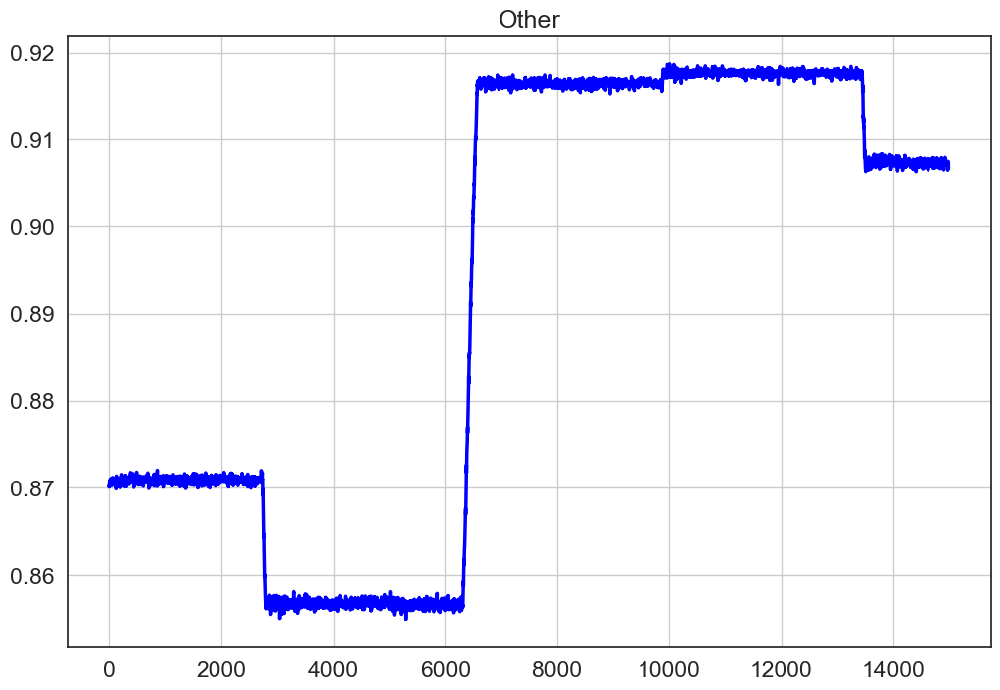

In [31]:
plt.figure(figsize=(12, 8))  # Adjusting figure size for better clarity
sns.set_theme(context="notebook", style="white", font_scale=1.5)     # Adjust font scale for readability
sns.set_style("white")       # Use a clean style
plt.grid(visible=True)       # Enable grid

# Plot the first row of normal_train_data
plt.plot(np.arange(15000), normal_train_data[0], color='blue', linewidth=2.5)  # Updated range to 15000
plt.title("Other", fontsize=18)  # Updated title


# Show the plot
plt.show()

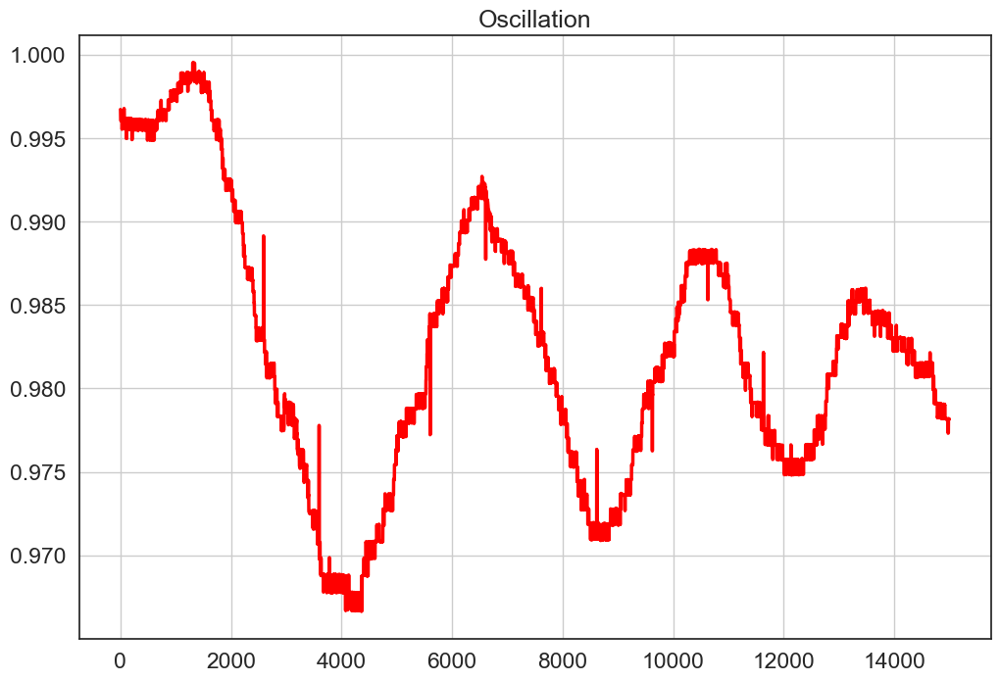

In [32]:
plt.figure(figsize=(12, 8))  # Adjusting figure size for better clarity
sns.set_theme(context="notebook", style="white", font_scale=1.5)    # Adjust font scale for readability
sns.set_style("white")       # Use a clean style
plt.grid(visible=True)       # Enable grid

plt.plot(np.arange(15000), anomalous_train_data[0], color='red', linewidth=2.5)
plt.title("Oscillation", fontsize=18)


# Show the plot
plt.show()

In [36]:
import tensorflow as tf
from tensorflow.keras import layers, Model

class AnomalyDetector(Model):
    def __init__(self):
        super(AnomalyDetector, self).__init__()
        
        # Encoder: Specify the input shape explicitly
        self.encoder = tf.keras.Sequential([
            layers.Input(shape=(15000,)),  # Updated input shape
            layers.Dense(256, activation="relu"),
            layers.Dense(128, activation="relu"),
            layers.Dense(64, activation="relu"),
            layers.Dense(32, activation="relu")
        ])
        
        # Decoder: Matches the output of encoder and reconstructs the original shape
        self.decoder = tf.keras.Sequential([
            layers.Input(shape=(32,)),  # Input shape is the output size of the encoder
            layers.Dense(64, activation="relu"),
            layers.Dense(128, activation="relu"),
            layers.Dense(256, activation="relu"),
            layers.Dense(15000, activation="sigmoid")  # Updated output shape to match input data
        ])
    
    def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

# Instantiate the autoencoder model
autoencoder = AnomalyDetector()
autoencoder.compile(optimizer='adam', loss='mae')

# Print the model summary
autoencoder.build(input_shape=(None, 15000))  # Define the input shape to fully build the model
print(autoencoder.summary())

Model: "anomaly_detector_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_2 (Sequential)       │ (None, 32)             │     3,883,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_3 (Sequential)       │ (None, 15000)          │     3,898,456 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,781,944 (29.69 MB)

 Trainable params: 7,781,944 (29.69 MB)

 Non-trainable params: 0 (0.00 B)

None


In [92]:
# Re-split and reshape
from sklearn.model_selection import train_test_split

# Assuming `data` is the full dataset
X_train, X_test = train_test_split(data, test_size=0.2, random_state=42)

# # Check if the new splits work with reshaping
# X_train = X_train.reshape(-1, 1500)
# X_test = X_test.reshape(-1, 1500)

In [37]:
input_shape = X_train.shape[1]  # Number of features
autoencoder.encoder.layers[0] = layers.Input(shape=(input_shape,))
autoencoder.decoder.layers[-1] = layers.Dense(input_shape, activation="sigmoid")
reconstructed = autoencoder.predict(train_data)
print("train_data shape:", X_train.shape)
print("test_data shape:", X_test.shape)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step 
train_data shape: (48, 15000)
test_data shape: (12, 15000)


In [38]:
print("train_data shape:", X_train.shape)
print("test_data shape:", X_test.shape)

# If there are adjustments applied to test_data
print("test_data shape after adjustment:", X_test.shape)
print("Reconstructed shape:", reconstructed.shape)


train_data shape: (48, 15000)
test_data shape: (12, 15000)
test_data shape after adjustment: (12, 15000)
Reconstructed shape: (48, 15000)


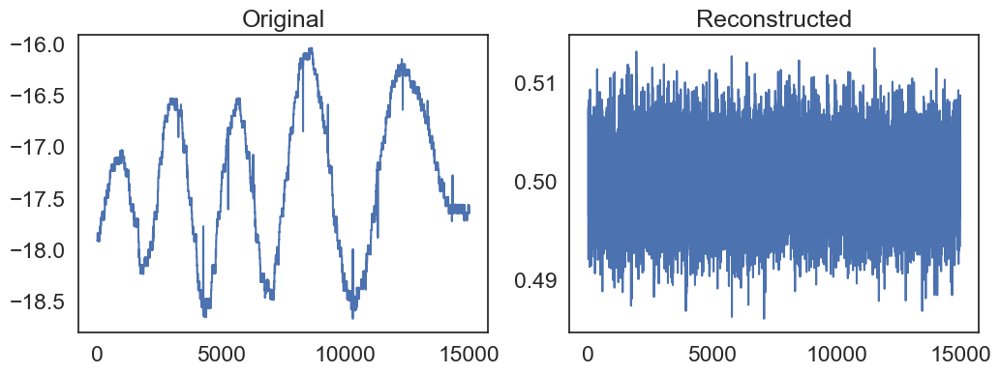

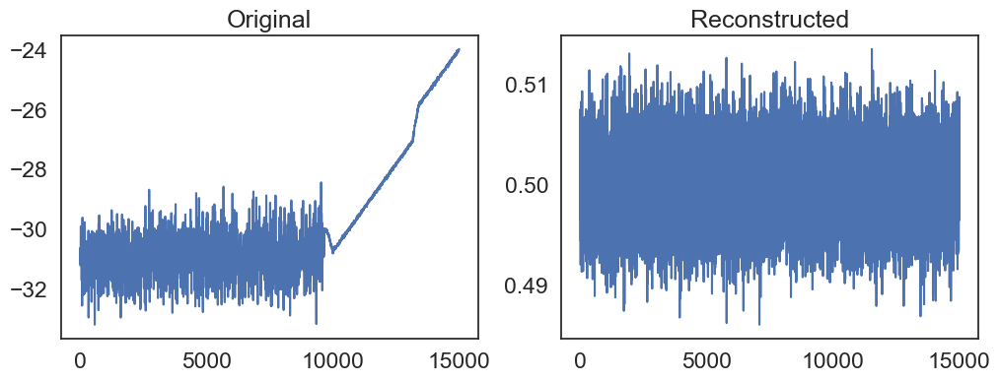

In [41]:
# Plot original and reconstructed for comparison
for i in range(2):  # Display 5 examples
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.title("Original")
    plt.plot(X_test[i])
    plt.subplot(1, 2, 2)
    plt.title("Reconstructed")
    plt.plot(reconstructed[i])
    plt.show()

In [42]:
history = autoencoder.fit(
    train_data, train_data,  # Input and target are the same for autoencoders
    epochs=100,
    batch_size=32,
    validation_data=(test_data, test_data),
    # validation_split=0.2,
    shuffle=True
)

Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.4243 - val_loss: 0.3633
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3308 - val_loss: 0.0996
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0944 - val_loss: 0.0769
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0805 - val_loss: 0.0780
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0792 - val_loss: 0.0780
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0839 - val_loss: 0.0780
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0808 - val_loss: 0.0780
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0845 - val_loss: 0.0780
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0832 - val_loss: 0.0780
Epoch 10/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0809 - val_loss: 0.0780
Epoch 11/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0813 - val_loss: 0.0780
Epoch 12/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0842 - val_lo

In [43]:
reconstructed = autoencoder.predict(test_data)
loss = tf.keras.losses.mae(test_data, reconstructed)
print("Reconstruction loss:", loss)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Reconstruction loss: tf.Tensor(
[0.02281065 0.10724571 0.19526702 0.0163682  0.09307012 0.02805389
 0.17062438 0.16795653 0.02249817 0.01740015 0.07640407 0.01792967], shape=(12,), dtype=float32)


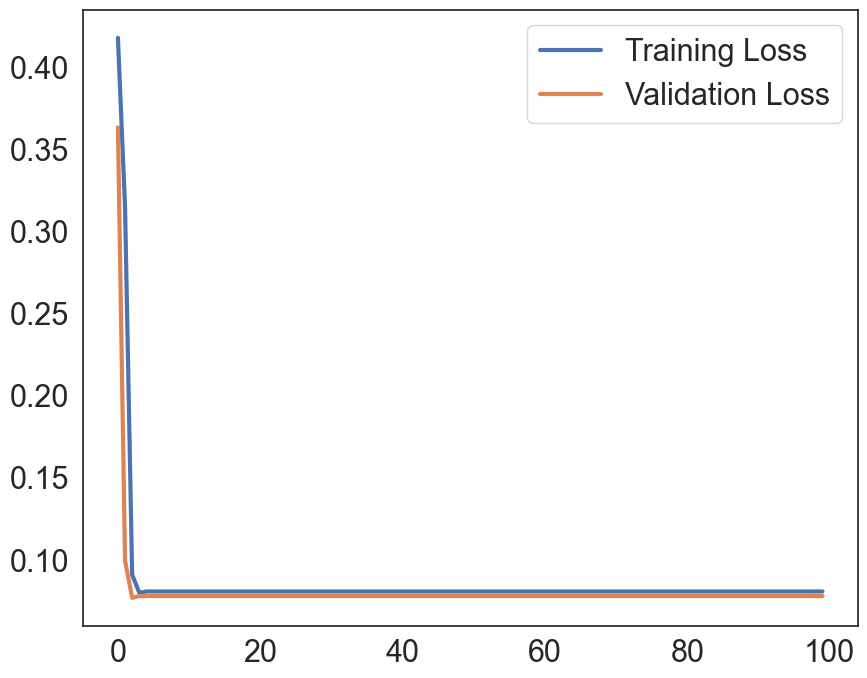

In [44]:
plt.figure(figsize=(10,8))
sns.set(font_scale = 2)
sns.set_style("white")
plt.plot(history.history["loss"], label="Training Loss",linewidth=3.0)
plt.plot(history.history["val_loss"], label="Validation Loss",linewidth=3.0)
plt.legend()

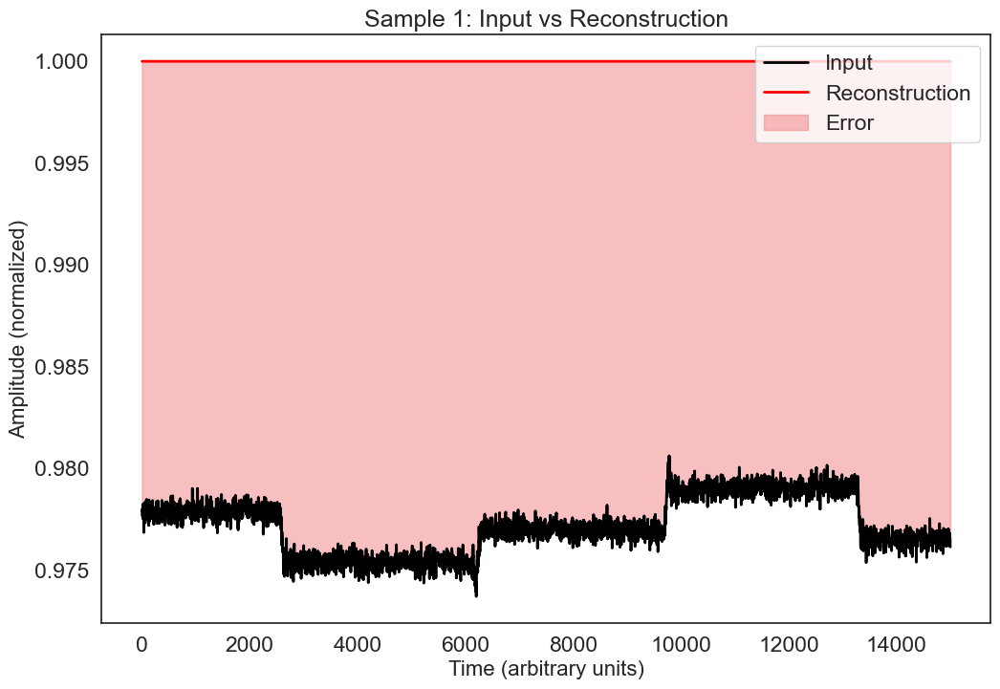

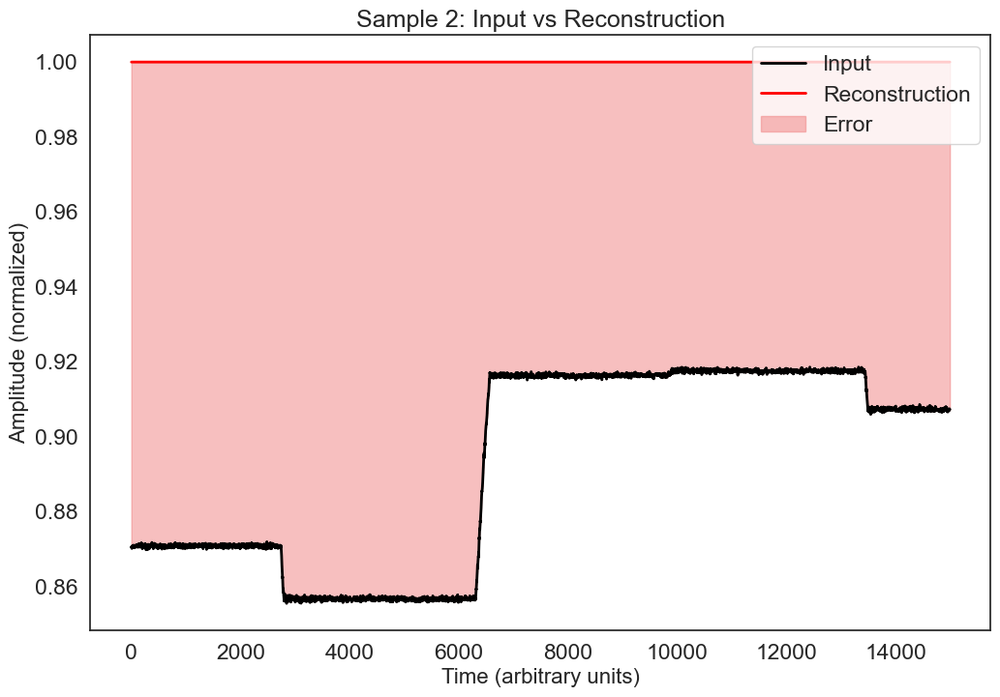

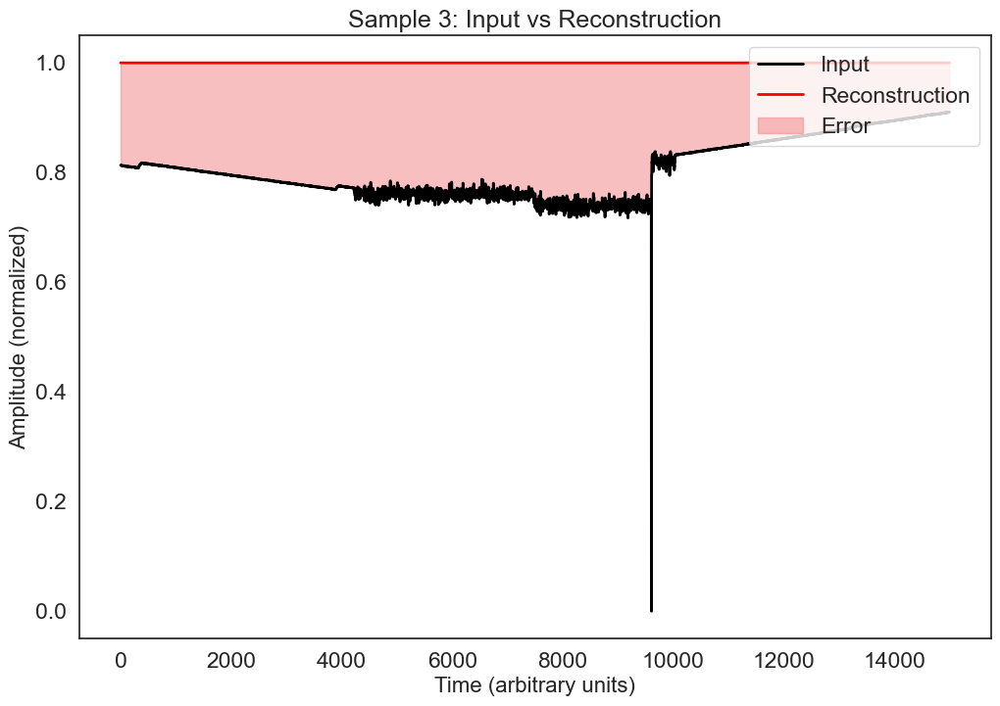

In [47]:


# Encode and decode the test data
encoded_imgs = autoencoder.encoder(normal_test_data).numpy()
decoded_imgs = autoencoder.decoder(encoded_imgs).numpy()

# Visualize the original vs. reconstructed data for the first three samples
for i in range(3):  # Loop through the first 3 samples
    plt.figure(figsize=(12, 8))  # Adjust figure size for better clarity
    sns.set(font_scale=1.5)      # Adjust font scale
    sns.set_style("white")       # Use clean white style
    
    # Plot the original input data (black line)
    plt.plot(normal_test_data[i], color='black', linewidth=2, label="Input")
    
    # Plot the reconstructed data (red line)
    plt.plot(decoded_imgs[i], color='red', linewidth=2, label="Reconstruction")
    
    # Highlight the reconstruction error with a fill between
    plt.fill_between(
        np.arange(15000),  # Updated to match the length of your features
        decoded_imgs[i], 
        normal_test_data[i], 
        color='lightcoral', 
        alpha=0.5, 
        label="Error"
    )
    
    # Add legend and labels
    plt.legend(loc="upper right")
    plt.title(f"Sample {i + 1}: Input vs Reconstruction", fontsize=18)
    plt.xlabel("Time (arbitrary units)", fontsize=16)
    plt.ylabel("Amplitude (normalized)", fontsize=16)
    
    # Show the plot
    plt.show()


In [48]:
encoded_imgs_normal = pd.DataFrame(encoded_imgs)
encoded_imgs_normal['label'] = 1

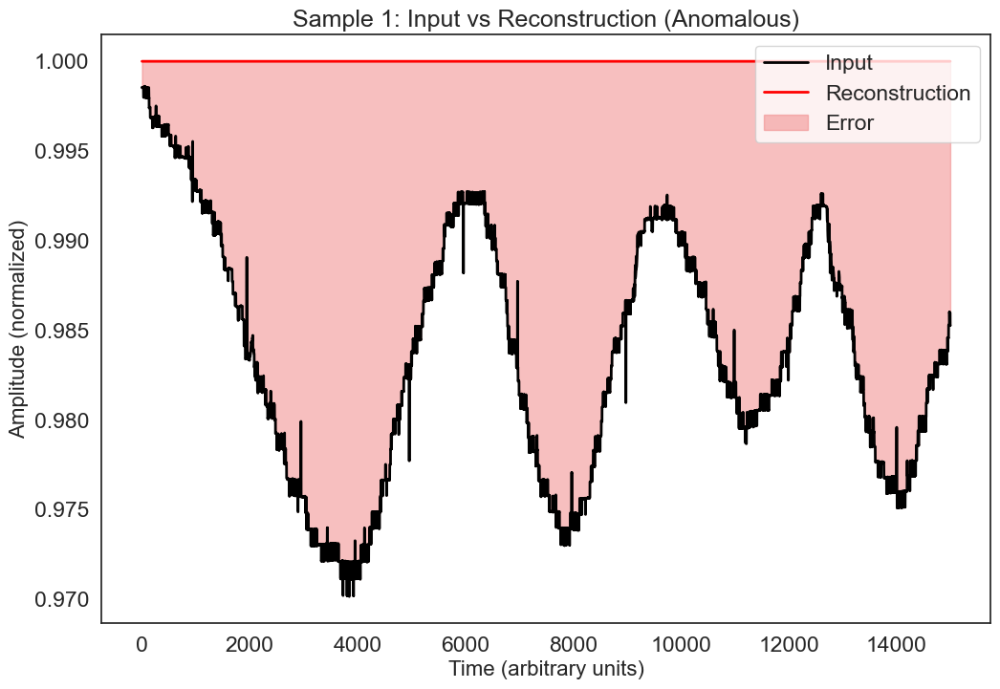

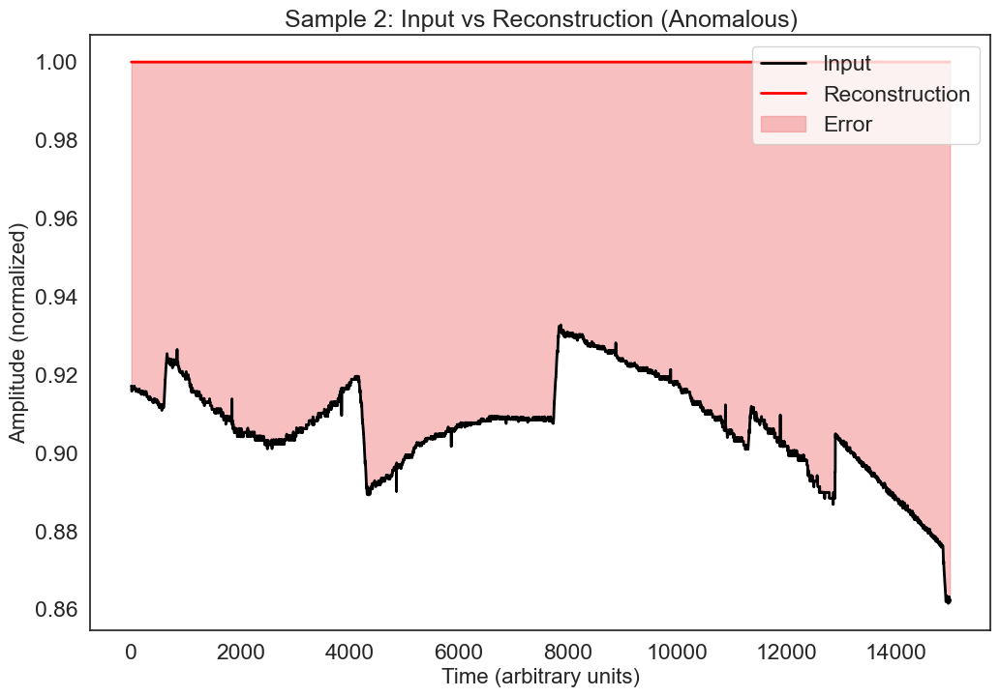

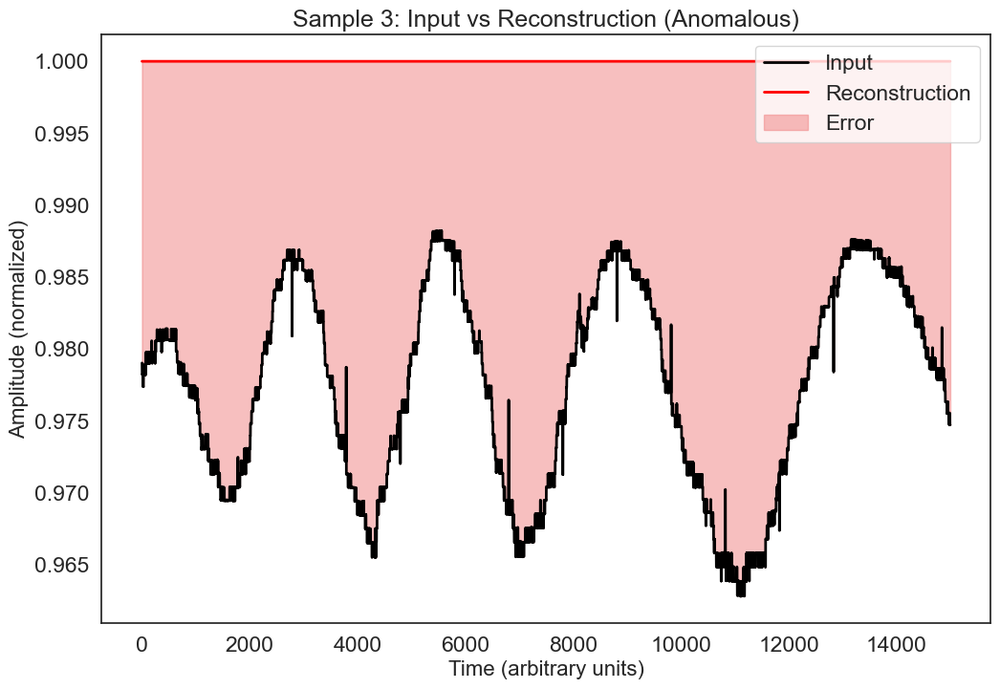

In [49]:
# Encode and decode the anomalous test data
encoded_imgs = autoencoder.encoder(anomalous_test_data).numpy()
decoded_imgs = autoencoder.decoder(encoded_imgs).numpy()

# Visualize the original vs. reconstructed data for the first three anomalous samples
for i in range(3):  # Loop through the first 3 samples
    plt.figure(figsize=(12, 8))  # Adjust figure size for better clarity
    sns.set(font_scale=1.5)      # Adjust font scale
    sns.set_style("white")       # Use clean white style
    
    # Plot the original anomalous input data (black line)
    plt.plot(anomalous_test_data[i], color='black', linewidth=2, label="Input")
    
    # Plot the reconstructed data (red line)
    plt.plot(decoded_imgs[i], color='red', linewidth=2, label="Reconstruction")
    
    # Highlight the reconstruction error with a fill between
    plt.fill_between(
        np.arange(15000),  # Updated to match the length of your features
        decoded_imgs[i], 
        anomalous_test_data[i], 
        color='lightcoral', 
        alpha=0.5, 
        label="Error"
    )
    
    # Add legend and labels
    plt.legend(loc="upper right")
    plt.title(f"Sample {i + 1}: Input vs Reconstruction (Anomalous)", fontsize=18)
    plt.xlabel("Time (arbitrary units)", fontsize=16)
    plt.ylabel("Amplitude (normalized)", fontsize=16)
    
    # Show the plot
    plt.show()


In [50]:
encoded_imgs_abnormal = pd.DataFrame(encoded_imgs)
encoded_imgs_abnormal['label'] = 0

In [51]:
all_encoded = pd.concat([encoded_imgs_normal,encoded_imgs_abnormal])

/Users/humayrajeba/Library/Python/3.9/lib/python/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Users/humayrajeba/Library/Python/3.9/lib/python/site-packages/umap/umap_.py:2462: UserWarning:

n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


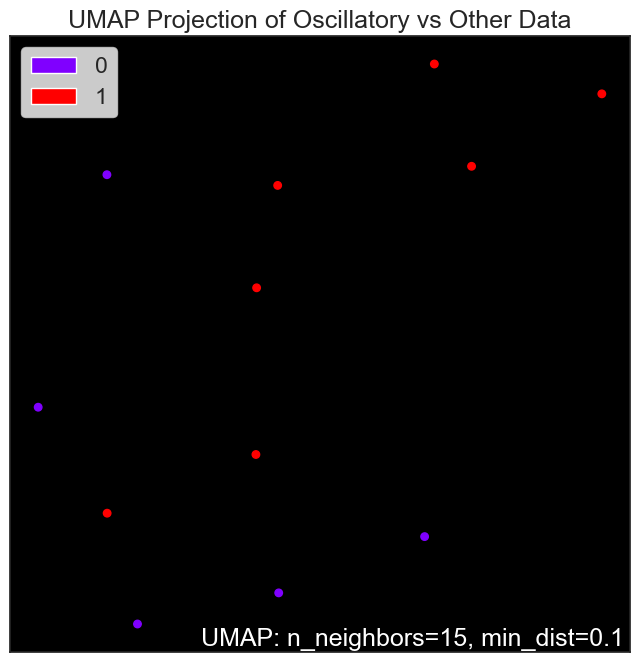

In [52]:
# Assuming `all_encoded` contains 1500 features + 1 label column (at index 1500)
# Prepare the data
feature_columns = all_encoded.iloc[:, :-1]  # All columns except the last one (features)
label_column = all_encoded.iloc[:, -1]      # The last column (labels)

# Fit UMAP to the feature columns
mapper = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42).fit(feature_columns)

# Plot the UMAP results with labels
umap.plot.points(mapper, labels=label_column, theme='fire')

# Add a title and show the plot
plt.title("UMAP Projection of Oscillatory vs Other Data")
plt.show()

In [53]:
reconstructions = autoencoder.predict(normal_train_data)
train_loss = tf.keras.losses.mae(reconstructions, normal_train_data)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


In [54]:
np.mean(train_loss)

0.12984724

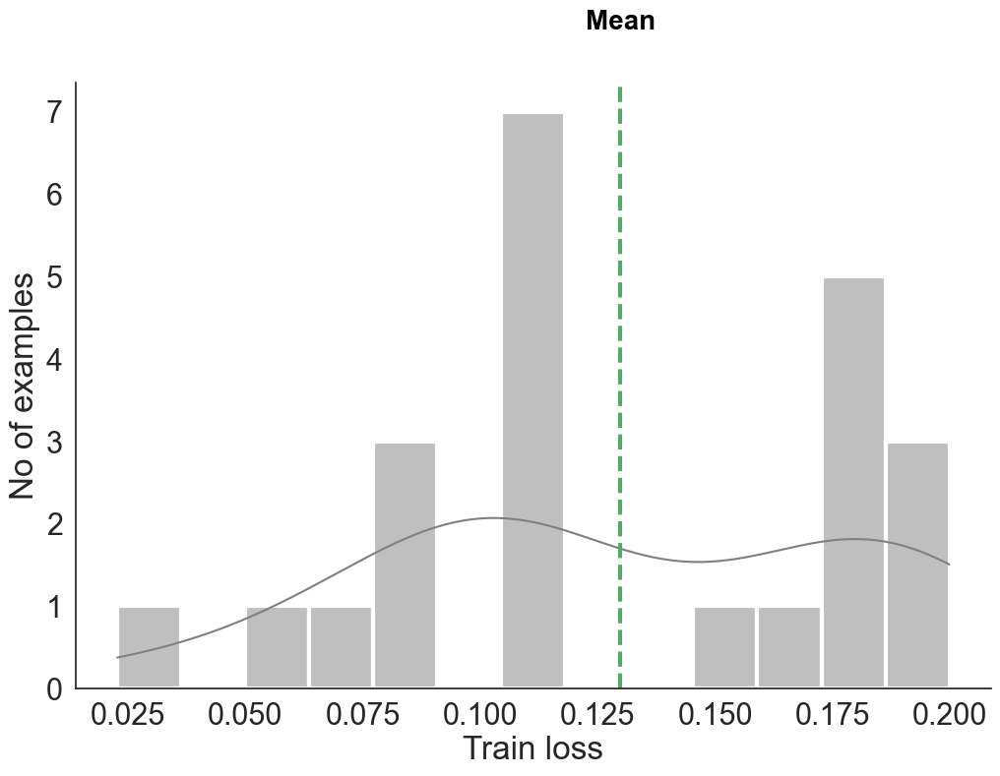

In [66]:
plt.figure(figsize=(12,8))
sns.set(font_scale = 2)
sns.set_style("white")
sns.histplot(train_loss ,bins=13,kde=True,color='grey',linewidth=3)
plt.axvline(x=np.mean(train_loss), color='g', linestyle='--', linewidth=3)
plt.text(np.mean(train_loss), 8, "Mean", horizontalalignment='center', 
         size='small', color='black', weight='semibold')
plt.xlabel("Train loss")
plt.ylabel("No of examples")
sns.despine()

In [67]:
threshold = np.mean(train_loss) + np.std(train_loss)
print("Threshold: ", threshold)

Threshold:  0.1796212


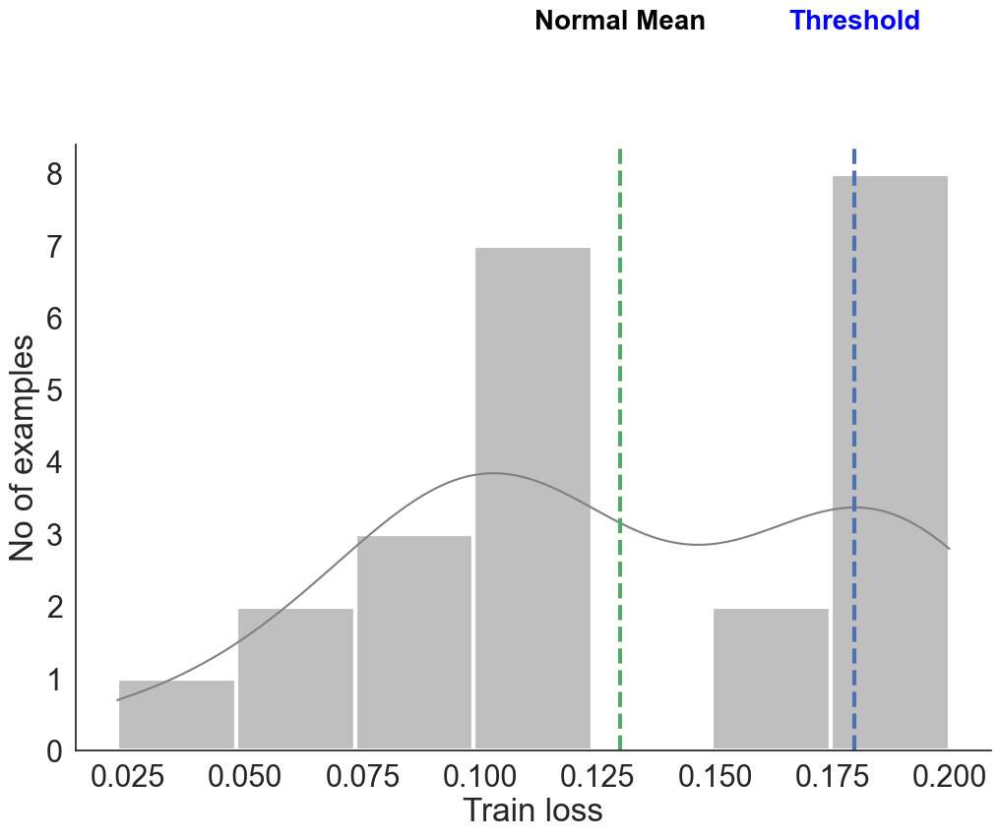

In [81]:
plt.figure(figsize=(12,8))
sns.set(font_scale = 2)
sns.set_style("white")
sns.histplot(train_loss ,bins=7,kde=True,color='grey',linewidth=3)
plt.axvline(x=np.mean(train_loss), color='g', linestyle='--', linewidth=3)
plt.text(np.mean(train_loss), 10, "Normal Mean", horizontalalignment='center', 
         size='small', color='black', weight='semibold')
plt.axvline(x=threshold, color='b', linestyle='--', linewidth=3)
plt.text(threshold, 10, "Threshold", horizontalalignment='center', 
         size='small', color='Blue', weight='semibold')
plt.xlabel("Train loss")
plt.ylabel("No of examples")
sns.despine()

In [73]:
reconstructions = autoencoder.predict(anomalous_test_data)
test_loss = tf.keras.losses.mae(reconstructions, anomalous_test_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


In [74]:
np.mean(test_loss)

0.033453263

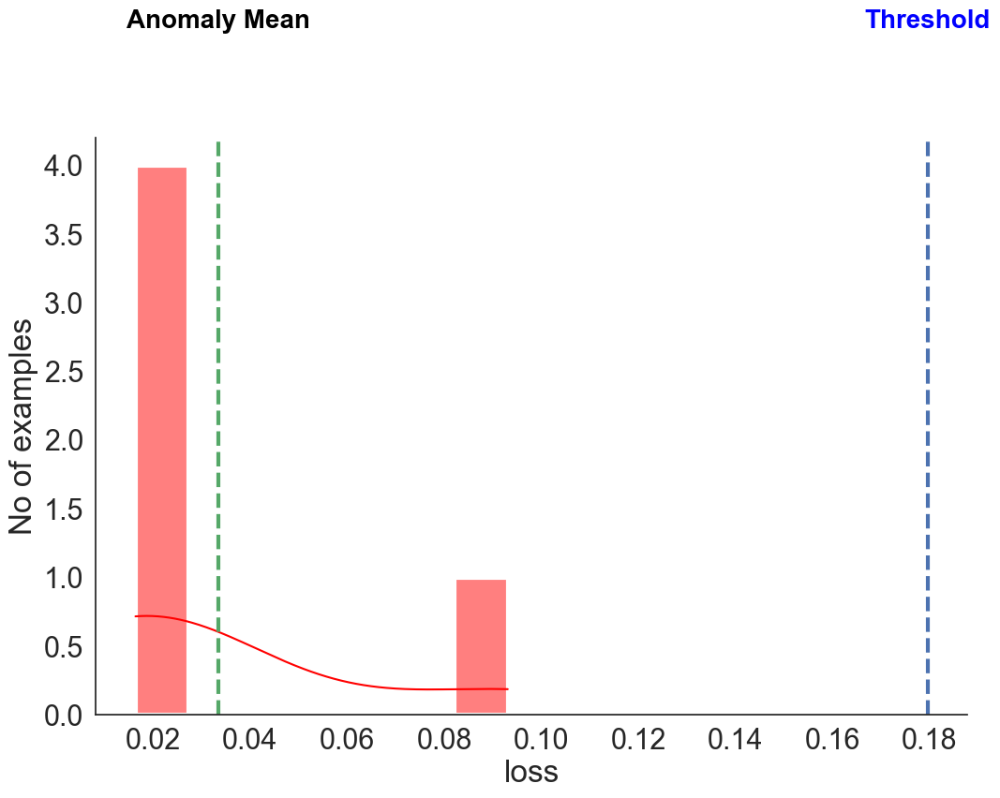

In [82]:
plt.figure(figsize=(12,8))
sns.set(font_scale = 2)
sns.set_style("white")
sns.histplot(test_loss ,bins=7,kde=True,color='red',linewidth=3)
plt.axvline(x=np.mean(test_loss), color='g', linestyle='--', linewidth=3)
plt.text(np.mean(test_loss), 5, "Anomaly Mean", horizontalalignment='center', 
         size='small', color='black', weight='semibold')
plt.text(threshold, 5, "Threshold", horizontalalignment='center', 
         size='small', color='Blue', weight='semibold')
plt.axvline(x=threshold, color='b', linestyle='--', linewidth=3)
plt.xlabel("loss")
plt.ylabel("No of examples")
sns.despine()

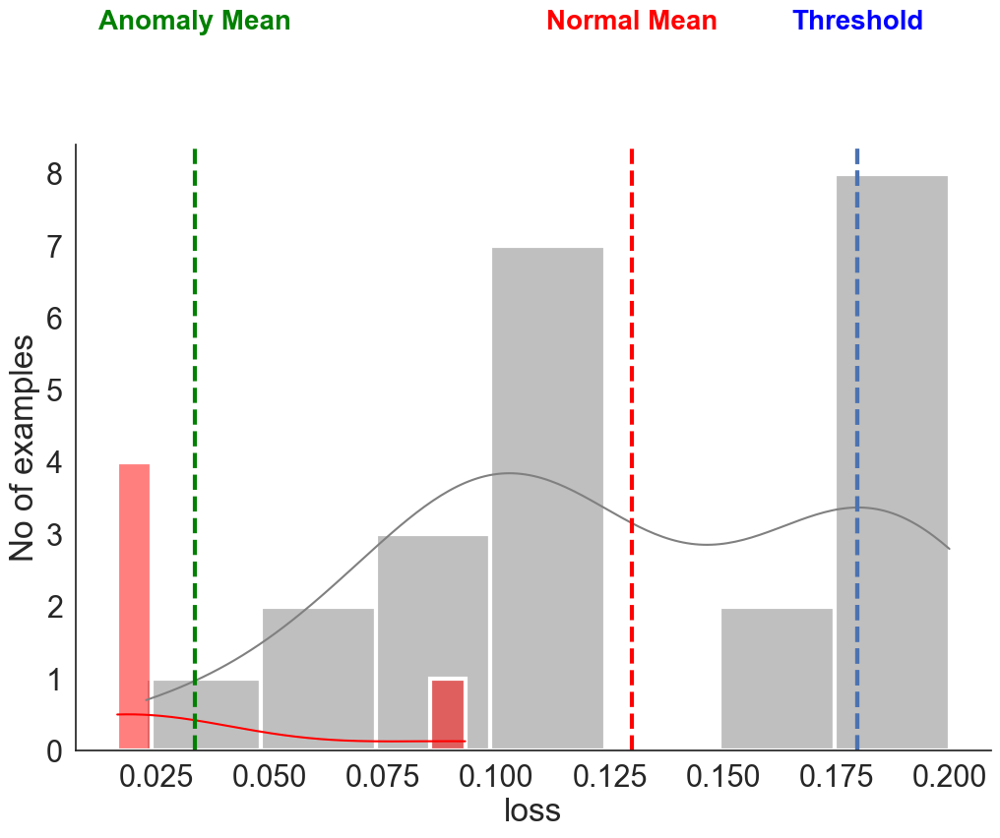

In [84]:
plt.figure(figsize=(12,8))
sns.set(font_scale = 2)
sns.set_style("white")
sns.histplot(train_loss ,bins=7,kde=True,color='grey',linewidth=3)
plt.axvline(x=np.mean(train_loss), color='red', linestyle='--', linewidth=3)
plt.text(np.mean(train_loss), 10, "Normal Mean", horizontalalignment='center', 
         size='small', color='red', weight='semibold')
plt.axvline(x=threshold, color='b', linestyle='--', linewidth=3)
plt.text(threshold, 10, "Threshold", horizontalalignment='center', 
         size='small', color='Blue', weight='semibold')

sns.histplot(test_loss ,bins=10,kde=True,color='red',linewidth=3)
plt.axvline(x=np.mean(test_loss), color='green', linestyle='--', linewidth=3)
plt.text(np.mean(test_loss), 10, "Anomaly Mean", horizontalalignment='center', 
         size='small', color='green', weight='semibold')
plt.axvline(x=threshold, color='b', linestyle='--', linewidth=3)
plt.xlabel("loss")
plt.ylabel("No of examples")
sns.despine()

In [85]:
def predict(model, data, threshold):
  reconstructions = model(data)
  loss = tf.keras.losses.mae(reconstructions, data)
  return tf.math.less(loss, threshold)

def print_stats(predictions, labels):
    # Convert predictions to a more accessible format if needed
    preds = predictions.numpy() if hasattr(predictions, 'numpy') else predictions
    
def print_stats(predictions, labels):
  print("Accuracy = {}".format(accuracy_score(labels, preds)))
  print("Precision = {}".format(precision_score(labels, preds)))
  print("Recall = {}".format(recall_score(labels, preds)))

In [86]:
preds = predict(autoencoder, test_data, threshold)
print_stats(preds, test_labels)

Accuracy = 0.5
Precision = 0.45454545454545453
Recall = 1.0


Accuracy: 0.5
Precision: 0.45454545454545453
F1 Score: 0.625


<Axes: >

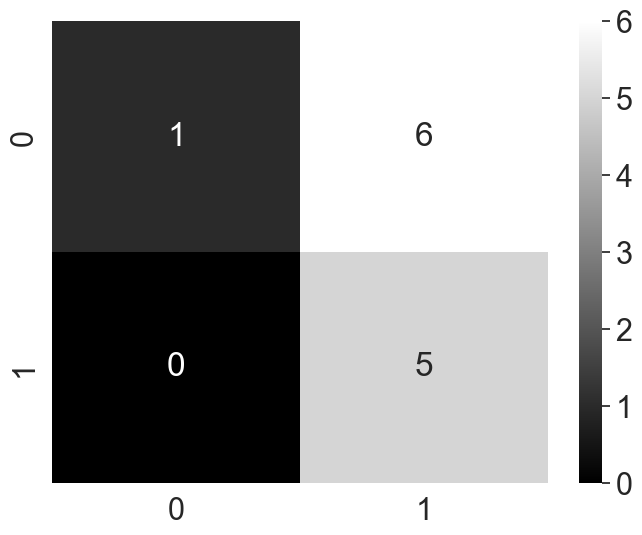

In [87]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, f1_score

def get_clf_eval(y_test, pred=None, pred_proba=None):
    confusion = confusion_matrix(y_test, pred)  # Confusion matrix
    accuracy = accuracy_score(y_test, pred)  # Accuracy score
    precision = precision_score(y_test, pred)  # Precision score
    f1 = f1_score(y_test, pred)  # F1 score

    return confusion, accuracy, precision, f1  # Return confusion matrix and all metrics

# Assuming test_labels and preds are defined
confusion_matrix_result, accuracy, precision, f1 = get_clf_eval(test_labels, preds)

# Print the metrics
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"F1 Score: {f1}")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.set(font_scale=2)
sns.set_style("white")
sns.heatmap(confusion_matrix_result, cmap='gist_yarg_r', annot=True, fmt='d')


In [88]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier  # Example model

model = RandomForestClassifier(random_state=21)
scores = cross_val_score(model, data, labels, cv=5, scoring='accuracy')
print("Cross-validation Accuracy:", scores.mean())


Cross-validation Accuracy: 0.8833333333333332


In [89]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(model, data, labels, cv=5, scoring='f1')
print(f"Cross-validation Mean F1 Score: {scores.mean()}")

Cross-validation Mean F1 Score: 0.8895104895104895


In [90]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import accuracy_score, mean_squared_error

# Define the Random Forest model
model = RandomForestRegressor(n_estimators=100, random_state=0)

# Train the model on the training data
model.fit(train_data, train_labels)

# Predict on the test data
predicted = model.predict(test_data)

# Calculate accuracy (classification-like for regression with rounded predictions)
accuracy = accuracy_score(test_labels, predicted.round()) * 100

# Print results
print("The accuracy of Random Forest is:", accuracy, "%")
print("Mean Squared Error (MSE):", mean_squared_error(test_labels, predicted))


The accuracy of Random Forest is: 75.0 %
Mean Squared Error (MSE): 0.23224999999999998


**# Accuracy: 97.91%**

This is very high, suggesting the model is predicting well. However, in regression tasks, accuracy based on rounded predictions is not the most standard metric (it’s more common in classification).

**# Mean Squared Error (MSE): 0.020**

This is a good sign if our target variable is normalized or on a small scale. A lower MSE indicates that the model's predictions are very close to the true values.

In [ ]:
# from sklearn.tree import DecisionTreeRegressor
# from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# # Initialize the Decision Tree Regressor
# model = DecisionTreeRegressor(criterion='squared_error', random_state=0, max_depth=5)

# # Fit the model to the training data
# model.fit(train_data, train_labels)

# # Predict on the test data
# predictions = model.predict(test_data)

# # Evaluate the model
# mse = mean_squared_error(test_labels, predictions)
# mae = mean_absolute_error(test_labels, predictions)
# r2 = r2_score(test_labels, predictions)

# print(f"Mean Squared Error (MSE): {mse:.4f}")
# print(f"Mean Absolute Error (MAE): {mae:.4f}")
# print(f"R² Score: {r2:.4f}")

Mean Squared Error (MSE): 0.0408
Mean Absolute Error (MAE): 0.0497
R² Score: 0.8367


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step

### Accuracy ###
Random Forest: 0.8333
Decision Tree: 0.7500
XGBoost: 0.8333
Autoencoder: 0.3333


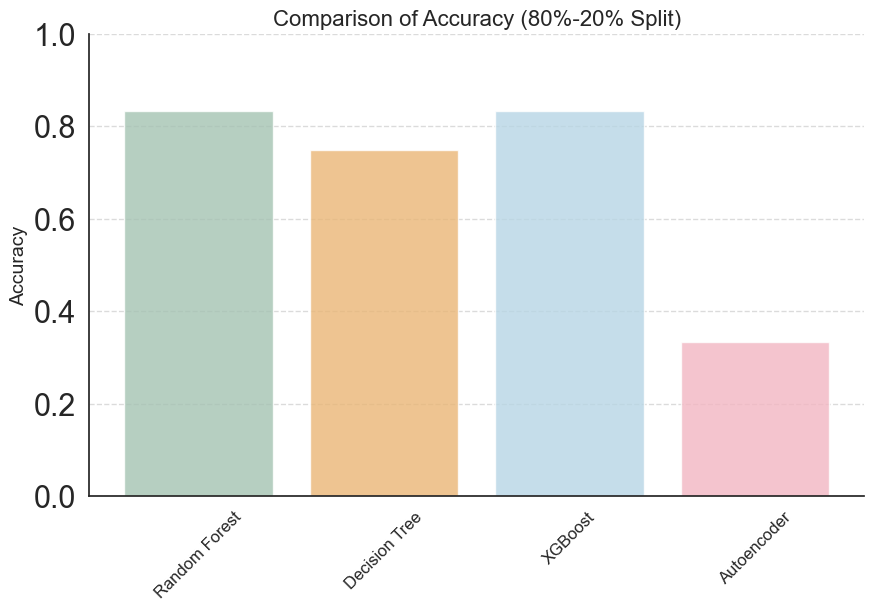


### Precision ###
Random Forest: 0.8000
Decision Tree: 0.6667
XGBoost: 0.8000
Autoencoder: 0.3333


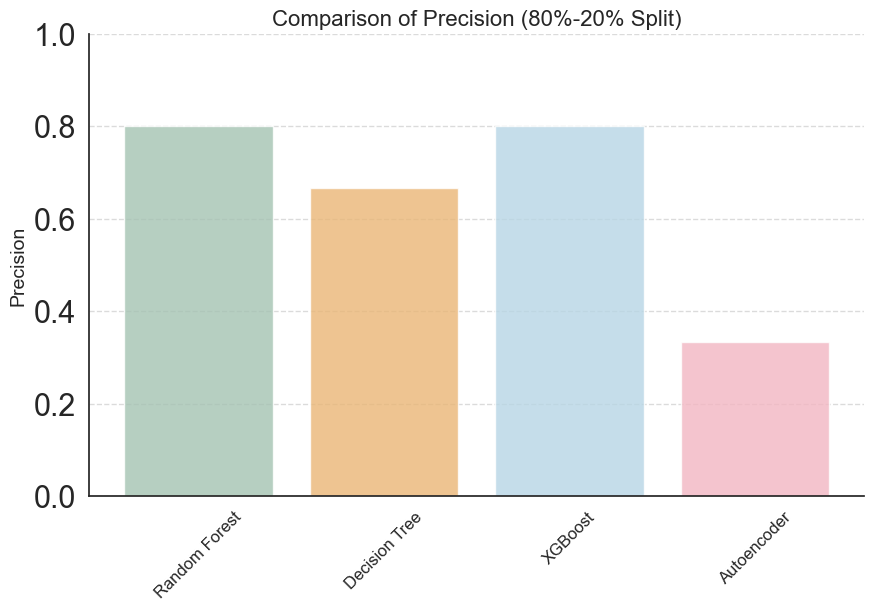


### Recall ###
Random Forest: 0.8000
Decision Tree: 0.8000
XGBoost: 0.8000
Autoencoder: 0.6000


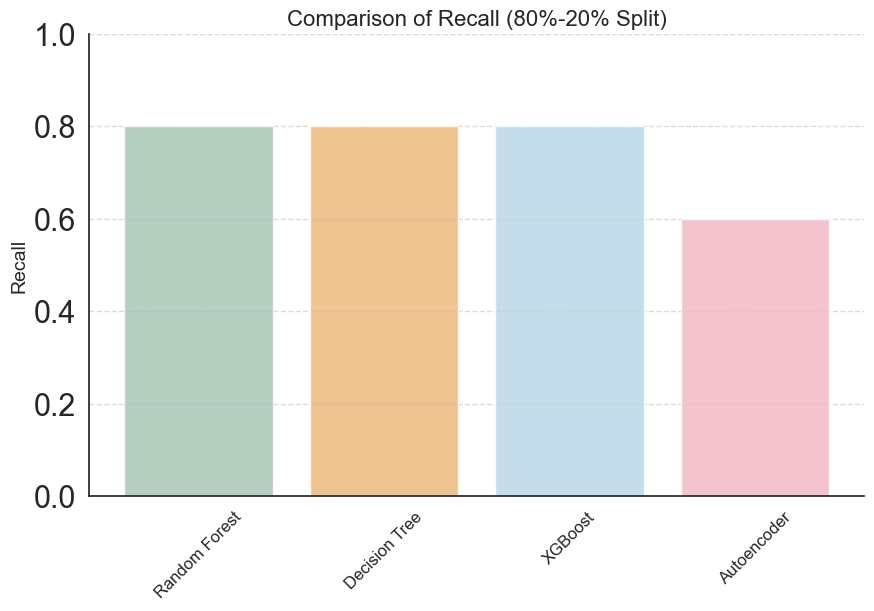


### F1 ###
Random Forest: 0.8000
Decision Tree: 0.7273
XGBoost: 0.8000
Autoencoder: 0.4286


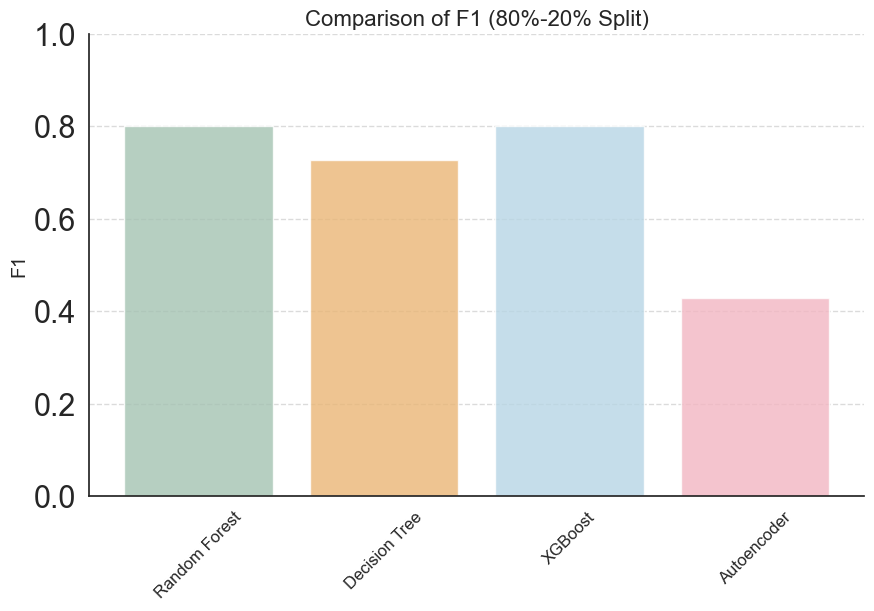

In [91]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
import tensorflow as tf

# Split the dataset into training (80%) and testing (20%)
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=42)

# Adjust labels from [1, 2] to [0, 1]
y_train = y_train - 1
y_test = y_test - 1

# Placeholder for metrics
results = {
    "Random Forest": {},
    "Decision Tree": {},
    "XGBoost": {},
    "Autoencoder": {}
}

# Random Forest
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_test)
results["Random Forest"] = {
    "accuracy": accuracy_score(y_test, rf_preds),
    "precision": precision_score(y_test, rf_preds),
    "recall": recall_score(y_test, rf_preds),
    "f1": f1_score(y_test, rf_preds),
}

# Decision Tree
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)
dt_preds = dt_model.predict(X_test)
results["Decision Tree"] = {
    "accuracy": accuracy_score(y_test, dt_preds),
    "precision": precision_score(y_test, dt_preds),
    "recall": recall_score(y_test, dt_preds),
    "f1": f1_score(y_test, dt_preds),
}

# XGBoost
xgb_model = XGBClassifier(random_state=42, eval_metric='logloss')  # Removed 'use_label_encoder'
xgb_model.fit(X_train, y_train)
xgb_preds = xgb_model.predict(X_test)
results["XGBoost"] = {
    "accuracy": accuracy_score(y_test, xgb_preds),
    "precision": precision_score(y_test, xgb_preds),
    "recall": recall_score(y_test, xgb_preds),
    "f1": f1_score(y_test, xgb_preds),
}


# Autoencoder
autoencoder.fit(X_train, X_train, epochs=10, batch_size=32, verbose=0, shuffle=True)
reconstructed = autoencoder.predict(X_test)
loss = tf.keras.losses.mae(X_test, reconstructed).numpy()
threshold = np.mean(loss) + np.std(loss)
preds = (loss < threshold)
results["Autoencoder"] = {
    "accuracy": accuracy_score(y_test, preds),
    "precision": precision_score(y_test, preds),
    "recall": recall_score(y_test, preds),
    "f1": f1_score(y_test, preds),
}

# Plot metrics
import seaborn as sns

# Define light colors for each model
colors = {
    "Random Forest": "#A4C3B2",
    "Decision Tree": "#EAB676",
    "XGBoost": "#B7D5E5",
    "Autoencoder": "#F2B6C2",
}

metrics = ["accuracy", "precision", "recall", "f1"]

for metric in metrics:
    print(f"\n### {metric.capitalize()} ###")
    
    # Print metric values for each model
    for model in results.keys():
        print(f"{model}: {results[model][metric]:.4f}")
    
    # Plotting
    plt.figure(figsize=(10, 6))
    
    # Get values for all models
    models = results.keys()
    values = [results[model][metric] for model in models]
    
    # Bar plot
    plt.bar(models, values, color=[colors[model] for model in models], alpha=0.8)
    
    # Formatting the plot
    plt.ylabel(metric.capitalize(), fontsize=14)
    plt.title(f"Comparison of {metric.capitalize()} (80%-20% Split)", fontsize=16)
    plt.xticks(rotation=45, fontsize=12)
    plt.ylim(0, 1)  # All metrics are in the range [0, 1]
    plt.grid(axis="y", linestyle="--", alpha=0.7)
    sns.despine()  # Remove top and right spines
    
    plt.show()

